In [1]:
import pandas as pd
import numpy as np
import string
import json
from IPython.display import display
import re
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from  datetime import datetime
from keras.applications.resnet50 import ResNet50
from keras.applications.xception import Xception
from keras.preprocessing import image
from keras.applications.resnet50 import preprocess_input, decode_predictions
import scipy.misc
from pathlib import Path
from urlpath import URL
import os
from copy import deepcopy
import mxnet as mx
import cv2
import numpy as np

from gluoncv import model_zoo, data, utils

from matplotlib.pyplot import imshow
%matplotlib inline

pd.options.display.max_columns = None
# Use 'display(df)' instead of 'df' to display all columns.

In [2]:
# # Encoding error. Open GB_videos_5p.csv in VSCode and save file as UTF-16 LE.
# df = pd.read_csv("./data/youtube_data/GB_videos_5p.csv", sep=';', encoding='utf_16')
# df["region"] = "GB"
# df.rename(columns={"description ": "description"}, inplace=True)
# print(df.shape)
# shapeOld = df.shape
# df.head(1)
dfGB = pd.read_csv("./GB_new_columns.csv",nrows=100)
dfUS = pd.read_csv("./US_new_columns.csv",nrows=100)

In [3]:
def readJSONList(path):
    with open(path, 'r') as file:
        loaded_list = json.loads(file.read())
    return loaded_list

def writeJSONList(path, list_to_save):
    with open(path, 'w') as file:
        file.write(json.dumps(list_to_save))

def downloadThumbnails(df, quality='hq'):
    list_of_ids_without_thumbnail = []
    ids = df["video_id"].values
    urls = df["thumbnail_link"].values
    
    region = df['region'][0]
    Path("./thumbnailsHQ/" + region).mkdir(parents=True, exist_ok=True)
    savepath = Path("./thumbnailsHQ/" + region)
    filename = quality + 'default.jpg'
    
    for id, url in zip(ids, urls): 
        temp_url = URL(url)
        temp_url = temp_url.parent / filename
        
        try:
            img = io.imread(str(temp_url))
        except Exception:
            list_of_ids_without_thumbnail.append(id)
            print(f"{id} no thumbnail")
            continue
        io.imsave(savepath / (id + ".png") , img)
    
    writeJSONList(savepath / "ids_without_thumbnail.txt", list_of_ids_without_thumbnail)
        
    return list_of_ids_without_thumbnail

(88, 299, 299, 3)


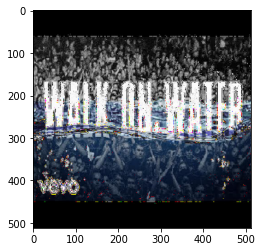

100


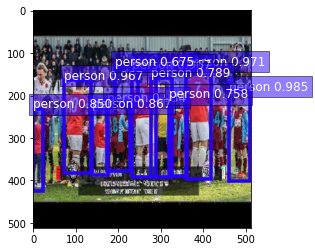

100


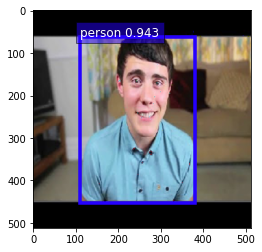

100


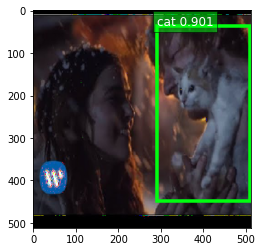

100


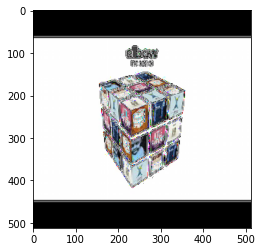

100


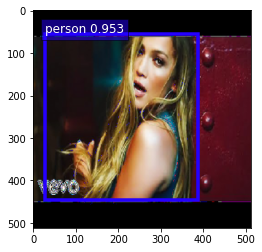

100


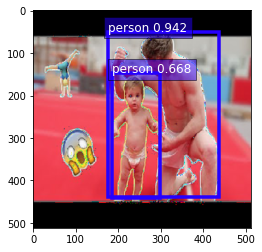

100


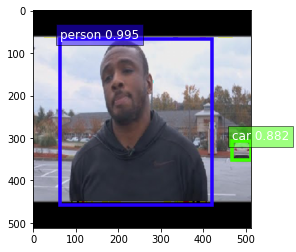

100


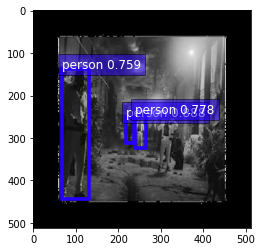

100


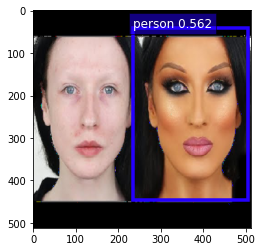

100


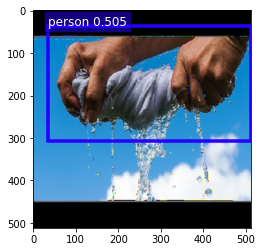

100


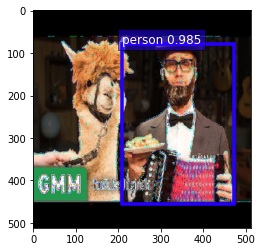

100


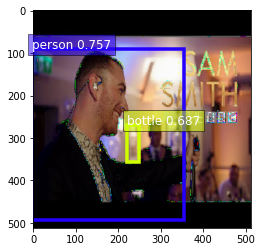

100


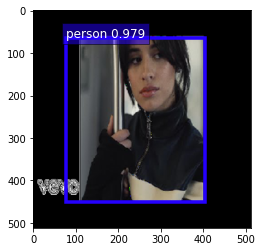

100


KeyboardInterrupt: 

In [17]:
# downloadThumbnails(dfUS)

list_of_files = []
path="data/thumbnailsHQ/GB/"
for root, dirs, files in os.walk(path):
    for file in files:
        list_of_files.append(os.path.join(file))

def load_files(df,list_of_files):
    images = []
    images_raw = []
    ids = []
    path="data/thumbnailsHQ/"+str(df['region'][0])+"/"
    for index, row in df.iterrows():
        if (""+row['video_id']+".png") in list_of_files:
            img_path = path+row['video_id']+".png"
            img = image.load_img(img_path, target_size=(299, 299))
            x = image.img_to_array(img)

#             print(x.shape)
#             print(type(x))
            images.append(x)
            ids.append(row['video_id'])
            images_raw.append(img)
#             df.loc[index,'img'] = 1
            

        else:
            pass
    #             print("not in " + str(row['video_id']))
    
    images_np = np.array(deepcopy(images))
#     images_np = preprocess_input(images_np)
    print(images_np.shape)
    return images_np, ids,images_raw


def load_filescv(df,list_of_files):
    images = []
    images_raw = []
    ids = []
    path="data/thumbnailsHQ/"+str(df['region'][0])+"/"
    for index, row in df.iterrows():
        if (""+row['video_id']+".png") in list_of_files:
            img_path = path+row['video_id']+".png"
            img = cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB)
            x = image.img_to_array(img)

#             print(x.shape)
#             print(type(x))
            images.append(x)
            ids.append(row['video_id'])
            images_raw.append(img)
#             df.loc[index,'img'] = 1
            

        else:
            pass
    #             print("not in " + str(row['video_id']))
    
    images_np = np.array(deepcopy(images))
#     images_np = preprocess_input(images_np)
    print(images_np.shape)
    return images_np, ids,images_raw

def get_predictionsYolo(dfGB,list_of_files):
    images,ids,images_raw = load_files(dfGB,list_of_files)
    net = model_zoo.get_model('yolo3_darknet53_voc',pretrained=True)
    narray = mx.ndarray.array(images)
    labels_all = []
    for img in narray:
        x, img = data.transforms.presets.yolo.transform_test(img, short=512)
        class_IDs, scores, bounding_boxs = net(x)
        ax = utils.viz.plot_bbox(img, bounding_boxs[0], scores[0],
                                 class_IDs[0], class_names=net.classes)
        plt.show()
        labels_img = []
        labels= np.array(net.classes)
        nids = class_IDs.asnumpy()
        nscores = scores.asnumpy()
        length = len(class_IDs[0])
        print(length)
        for l in range(length):
            if nids.item(l) != -1:
                labels_img.append([labels[int(nids.item(l))],nscores.item(l)])
            else:
                break

        labels_all.append(labels_img)
        

    return labels_all


    
def get_predictionsImagenet(dfGB,list_of_files):
    images,ids,images_raw = load_files(dfGB,list_of_files) 
    model = Xception(weights='imagenet')
    preds = model.predict(images)
    return decode_predictions(preds, top=3)
    
# images_np,ids,images_raw = load_files()
# predictions = get_predictions(images_np)
preds = get_predictionsYolo(dfGB,list_of_files)
# print(preds)

In [ ]:
preds

In [10]:
net = model_zoo.get_model('mask_rcnn_resnet50_v1b_coco', pretrained=True)

im_fname = utils.download('https://github.com/dmlc/web-data/blob/master/' +
                          'gluoncv/detection/biking.jpg?raw=true',
                          path='biking.jpg')
x, orig_img = data.transforms.presets.rcnn.load_test(im_fname)
print(x.shape)
print(type(x))
images_np,ids,images_raw  = load_files(dfGB,list_of_files)
narray = mx.ndarray.array(images_np)
for img in narray:
    x, orig_img = data.transforms.presets.rcnn.transform_test(img)
    ids, scores, bboxes, masks = [xx[0].asnumpy() for xx in net(x)]
    

#     # paint segmentation mask on images directly
#     width, height = orig_img.shape[1], orig_img.shape[0]
#     masks, _ = utils.viz.expand_mask(masks, bboxes, (width, height), scores)
#     orig_img = utils.viz.plot_mask(orig_img, masks)

#     # identical to Faster RCNN object detection
#     fig = plt.figure(figsize=(10, 10))
#     ax = fig.add_subplot(1, 1, 1)
#     ax = utils.viz.plot_bbox(orig_img, bboxes, scores, ids,
#                              class_names=net.classes, ax=ax)
#     plt.show()


(1, 3, 600, 956)
<class 'mxnet.ndarray.ndarray.NDArray'>
(88, 299, 299, 3)
(1000, 1)
<class 'numpy.ndarray'>


TypeError: 'float' object is not iterable

In [17]:

print(ids.shape)
print(type(ids))
ids.item(0)
ids

(1000, 1)
<class 'numpy.ndarray'>


array([[13.],
       [13.],
       [13.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 0.],
       [43.],
       [ 0.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 3.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 3.],
       [ 0.],
       [30.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 3.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 2.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 3.],
       [ 2.],
       [ 0.],
       [ 2.],
       [ 0.],
       [ 0.],
       [30.],
       [13.],
       [ 2.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 0.],
       [ 1.],
       [ 2.],
       [ 0.],
      

(88, 360, 480, 3)


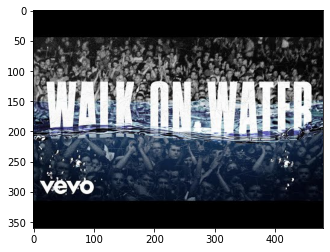

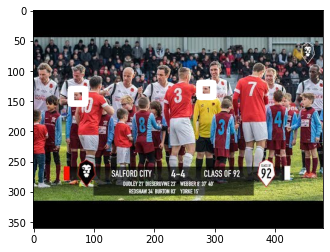

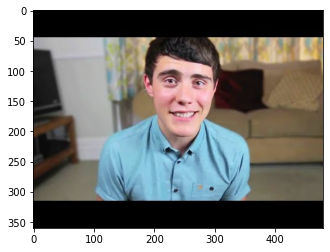

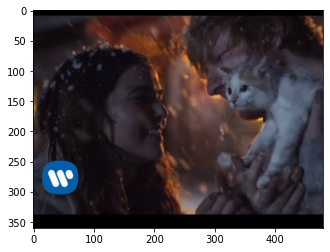

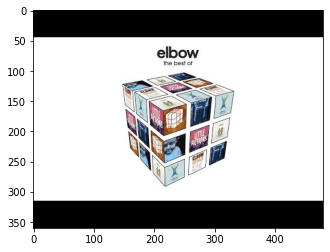

...

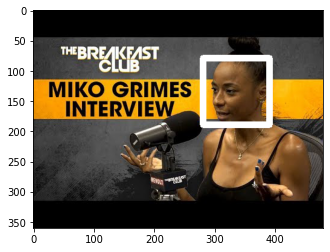

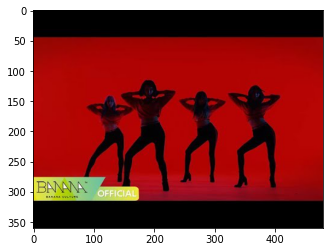

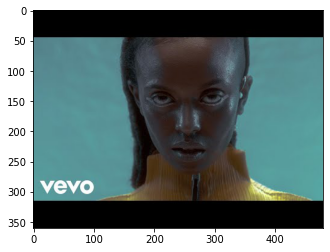

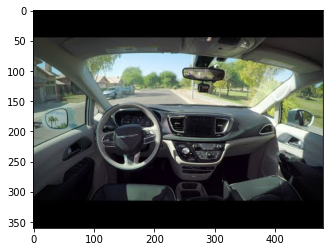

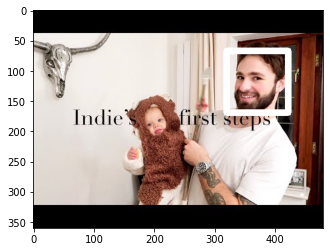

In [56]:


# Read in the cascade classifiers for face and eyes
# face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +'frontalface_default.xml')
# face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +'haarcascade_frontalcatface_extended.xml')
# face_cascade = cv2.CascadeClassifier(cv2.data.haarcascade/s +'haarcascade_fullbody.xml')
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +'haarcascade_profileface.xml')
# face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades +'haarcascade_upperbody.xml')
eye_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + "haarcascade_eye.xml")



# create a function to detect face
def adjusted_detect_face(img):
    
    face_img = img.copy()
    
    face_rect = face_cascade.detectMultiScale(face_img,
                                            scaleFactor = 1.2,
                                            minNeighbors = 5)
    
    for (x, y, w, h) in face_rect:
        cv2.rectangle(face_img, (x, y),
                    (x + w, y + h), (255, 255, 255), 10)\
        
    return face_img


# create a function to detect eyes
def detect_eyes(img):
    
    eye_img = img.copy()    
    eye_rect = eye_cascade.detectMultiScale(eye_img,
                                            scaleFactor = 1.2,
                                            minNeighbors = 5)    
    for (x, y, w, h) in eye_rect:
        cv2.rectangle(eye_img, (x, y),
                    (x + w, y + h), (255, 255, 255), 10)        
    return eye_img

images,ids,images_raw = load_filescv(dfGB,list_of_files) 
# Reading in the image and creating copies
for img in images_raw:
    img_copy1 = img.copy()
    img_copy2 = img.copy()
    img_copy3 = img.copy()

    # Detecting the face
    face = adjusted_detect_face(img_copy1)
#     eye = detect_eyes(img_copy2)
    plt.imshow(face)
#     plt.imshow(eye)
    plt.show()
